In [1]:
import numpy as np   
from sklearn.linear_model import LinearRegression
import pandas as pd    
import matplotlib.pyplot as plt 
%matplotlib inline 
import seaborn as sns
from sklearn.decomposition import PCA

In [2]:
df=pd.read_csv('Dataset/houseprice.csv')

In [3]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
df.shape

(1460, 81)

In [6]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [13]:
df.isnull().value().any

AttributeError: 'DataFrame' object has no attribute 'value'

<AxesSubplot:>

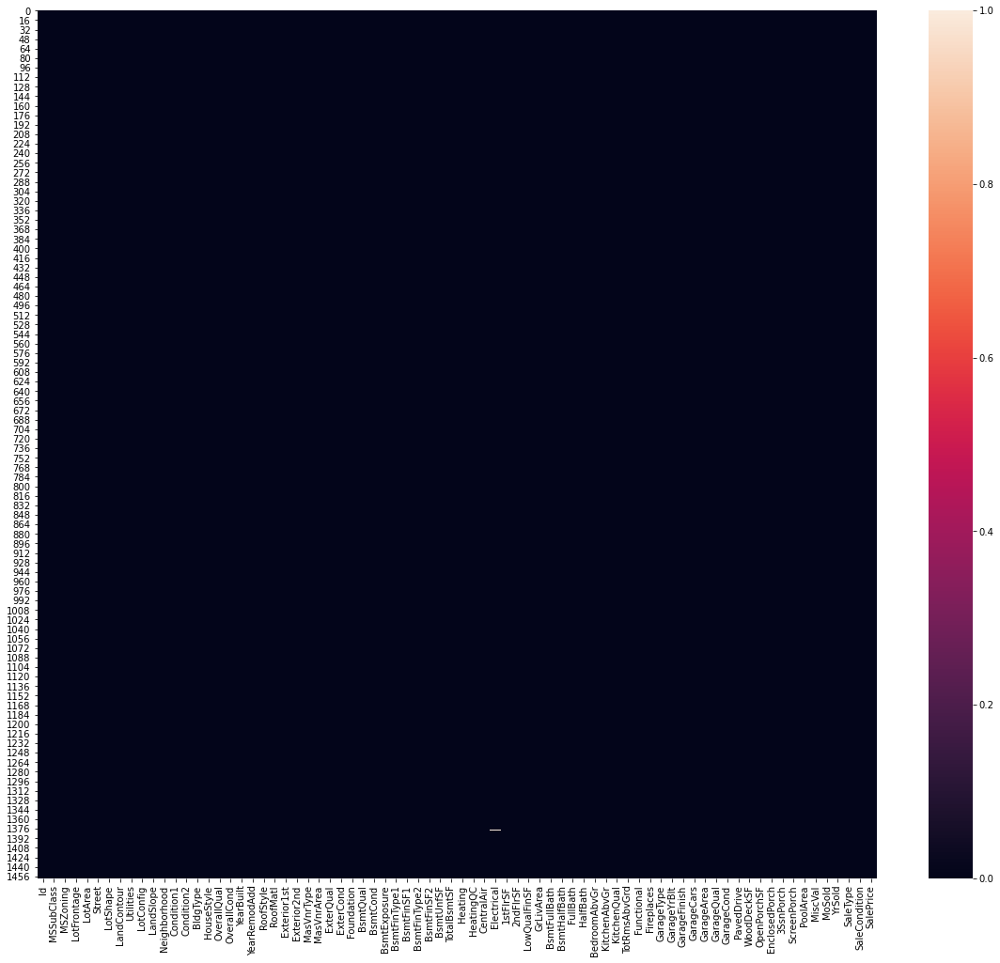

In [51]:
plt.subplots(figsize=(20,17))
sns.heatmap(df.isnull())

In [15]:
print(df.isnull().sum())

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64


In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [38]:
cols=['PoolQC','Fence','MiscFeature','Alley','FireplaceQu']

In [39]:
df.drop(cols,axis=1,inplace=True)

In [40]:
df.shape

(1460, 76)

In [30]:
df['LotFrontage'].mean()

70.04995836802665

In [41]:
df['LotFrontage']=df['LotFrontage'].replace(np.nan,df['LotFrontage'].mean())

In [43]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle',
       'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle',
       'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF',
       'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath',
       'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPo

In [44]:
n_cols=['MasVnrType','MasVnrArea','BsmtFinType2','GarageCond','GarageQual','GarageType','GarageYrBlt','GarageFinish']

In [46]:
df[n_cols]=df[n_cols].fillna(df.mode().iloc[0])

In [49]:
nw_cols=['BsmtQual', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1']

In [50]:
df[nw_cols]=df[nw_cols].fillna(df.mode().iloc[0])

In [55]:
df['Electrical']=df['Electrical'].replace(np.nan,df['Electrical'].mode().iloc[0])

In [70]:
for att in df.columns:
    if df[att].dtype=='object':
        print(att,"  :  ",df[att].unique())

MSZoning   :   ['RL' 'RM' 'C (all)' 'FV' 'RH']
Street   :   ['Pave' 'Grvl']
LotShape   :   ['Reg' 'IR1' 'IR2' 'IR3']
LandContour   :   ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities   :   ['AllPub' 'NoSeWa']
LotConfig   :   ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope   :   ['Gtl' 'Mod' 'Sev']
Neighborhood   :   ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1   :   ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2   :   ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
BldgType   :   ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle   :   ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle   :   ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
RoofMatl   :   ['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Ta

In [72]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()

In [74]:
for i in df.columns:
    if df[i].dtype=='object':
        df[i]= label_encoder.fit_transform(df[i])

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   int32  
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   int32  
 6   LotShape       1460 non-null   int32  
 7   LandContour    1460 non-null   int32  
 8   Utilities      1460 non-null   int32  
 9   LotConfig      1460 non-null   int32  
 10  LandSlope      1460 non-null   int32  
 11  Neighborhood   1460 non-null   int32  
 12  Condition1     1460 non-null   int32  
 13  Condition2     1460 non-null   int32  
 14  BldgType       1460 non-null   int32  
 15  HouseStyle     1460 non-null   int32  
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [78]:
x=df.drop(['SalePrice'],axis=1)
y=df['SalePrice']

In [79]:
from scipy.stats import zscore
XScaled=x.apply(zscore)
XScaled.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,-1.730865,0.073375,-0.045532,-0.229372,-0.207142,0.064238,0.750731,0.314667,-0.02618,0.604670,...,0.216503,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,0.138777,0.313867,0.208502
1,-1.728492,-0.872563,-0.045532,0.451936,-0.091886,0.064238,0.750731,0.314667,-0.02618,-0.628316,...,-0.704483,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,-0.489110,-0.614439,0.313867,0.208502
2,-1.726120,0.073375,-0.045532,-0.093110,0.073480,0.064238,-1.378933,0.314667,-0.02618,0.604670,...,-0.070361,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,0.990891,0.138777,0.313867,0.208502
3,-1.723747,0.309859,-0.045532,-0.456474,-0.096897,0.064238,-1.378933,0.314667,-0.02618,-1.861302,...,-0.176048,4.092524,-0.116339,-0.270208,-0.068692,-0.087688,-1.599111,-1.367655,0.313867,-3.426284
4,-1.721374,0.073375,-0.045532,0.633618,0.375148,0.064238,-1.378933,0.314667,-0.02618,-0.628316,...,0.563760,-0.359325,-0.116339,-0.270208,-0.068692,-0.087688,2.100892,0.138777,0.313867,0.208502


In [80]:
covMatrix = np.cov(XScaled,rowvar=False)
print(covMatrix)

[[ 1.00068540e+00  1.11641249e-02 -6.10029226e-03 ...  7.12281881e-04
   1.97869611e-02 -5.80978086e-03]
 [ 1.11641249e-02  1.00068540e+00  3.59246662e-02 ... -2.14217103e-02
   1.24727778e-02 -2.49566714e-02]
 [-6.10029226e-03  3.59246662e-02  1.00068540e+00 ... -2.06417083e-02
   9.75040488e-02  9.50002094e-03]
 ...
 [ 7.12281881e-04 -2.14217103e-02 -2.06417083e-02 ...  1.00068540e+00
  -2.32888954e-03  3.88308594e-03]
 [ 1.97869611e-02  1.24727778e-02  9.75040488e-02 ... -2.32888954e-03
   1.00068540e+00  1.84192716e-01]
 [-5.80978086e-03 -2.49566714e-02  9.50002094e-03 ...  3.88308594e-03
   1.84192716e-01  1.00068540e+00]]


In [96]:
pca = PCA(n_components=30)
pca.fit(XScaled)

PCA(n_components=30)

In [97]:
print(pca.explained_variance_)

[10.23418949  4.02983416  3.69568163  2.93282632  2.27007275  2.0802461
  1.82094949  1.71855267  1.58834797  1.55030131  1.49500339  1.43248467
  1.33947807  1.33444279  1.2654231   1.21103801  1.17009008  1.13249622
  1.12759489  1.11232221  1.09784197  1.08236173  1.06499944  1.02963252
  0.98050031  0.94945585  0.94021373  0.91100872  0.89465377  0.85725308]


In [98]:
print(pca.components_)

[[-0.00241797 -0.00889257 -0.08326458 ... -0.00609841 -0.01987895
   0.07516119]
 [ 0.00848842  0.05942053  0.02527424 ... -0.03835865  0.00036498
  -0.00976941]
 [-0.00656138 -0.2240317   0.07246258 ... -0.00069179 -0.00674119
  -0.05906285]
 ...
 [ 0.26491298  0.05742174 -0.14170029 ... -0.14059842  0.21156714
  -0.13895513]
 [ 0.35817721 -0.03272134  0.05563241 ... -0.1639586  -0.05859683
  -0.00175833]
 [ 0.11158009  0.00343804 -0.16914294 ...  0.00362478  0.07434141
   0.08411594]]


In [99]:
print(pca.explained_variance_ratio_)

[0.1363624  0.05369432 0.049242   0.03907757 0.03024691 0.02771762
 0.0242627  0.02289834 0.02116347 0.02065653 0.01991973 0.01908671
 0.01784747 0.01778038 0.01686075 0.01613611 0.01559052 0.01508961
 0.0150243  0.0148208  0.01462787 0.01442161 0.01419027 0.01371903
 0.01306438 0.01265074 0.0125276  0.01213846 0.01192055 0.01142221]


In [103]:
pca3 = PCA(n_components=30)
pca3.fit(XScaled)
print(pca3.components_)
print(pca3.explained_variance_ratio_)
Xpca3 = pca3.transform(XScaled)

[[-2.41760750e-03 -8.89251020e-03 -8.32643330e-02 ... -6.09807116e-03
  -1.98788054e-02  7.51606304e-02]
 [ 8.55263780e-03  5.94202724e-02  2.52754930e-02 ... -3.84066879e-02
   3.28132553e-04 -9.73454245e-03]
 [-6.56497114e-03 -2.24019334e-01  7.24508772e-02 ... -7.26679221e-04
  -6.75870729e-03 -5.90590233e-02]
 ...
 [-2.10003732e-01 -6.10049725e-03  2.20998545e-02 ...  2.00316881e-02
   6.92578553e-02 -1.28305892e-01]
 [-4.55350170e-01 -2.30902948e-02  7.43522059e-02 ...  1.22432849e-01
  -1.70648348e-01  1.49663680e-01]
 [ 4.82598738e-02 -1.15959294e-02  7.27087628e-02 ... -1.25625365e-01
  -1.58446462e-01 -3.22947812e-02]]
[0.1363624  0.05369431 0.04924199 0.0390776  0.03024742 0.02771811
 0.02425986 0.02289505 0.0211651  0.02065982 0.01990417 0.01910132
 0.01783506 0.01779354 0.01685341 0.01612891 0.01561055 0.01528062
 0.01510542 0.01480105 0.01465098 0.01444293 0.01414324 0.01366891
 0.01312651 0.01283111 0.01271812 0.01230771 0.01210182 0.01161727]


In [104]:
Xpca3

array([[ 2.1357148 ,  0.15154607, -1.91786401, ..., -0.71839303,
         1.07287043, -0.20932926],
       [ 0.17692683, -1.8024418 ,  1.5534133 , ...,  1.72478214,
         0.80107921,  0.34367376],
       [ 2.56476316, -0.01115241, -1.46381244, ..., -0.3277731 ,
         0.89864112,  0.33011189],
       ...,
       [ 1.36120632,  2.73708585,  0.05951536, ..., -1.6192392 ,
         1.26991887,  0.97574286],
       [-2.98002944, -2.6011475 ,  2.17079441, ...,  0.65340951,
         0.08333154,  0.30517029],
       [-0.7981277 , -2.46784598,  1.88317315, ...,  0.83275985,
        -0.66772658,  1.48353267]])

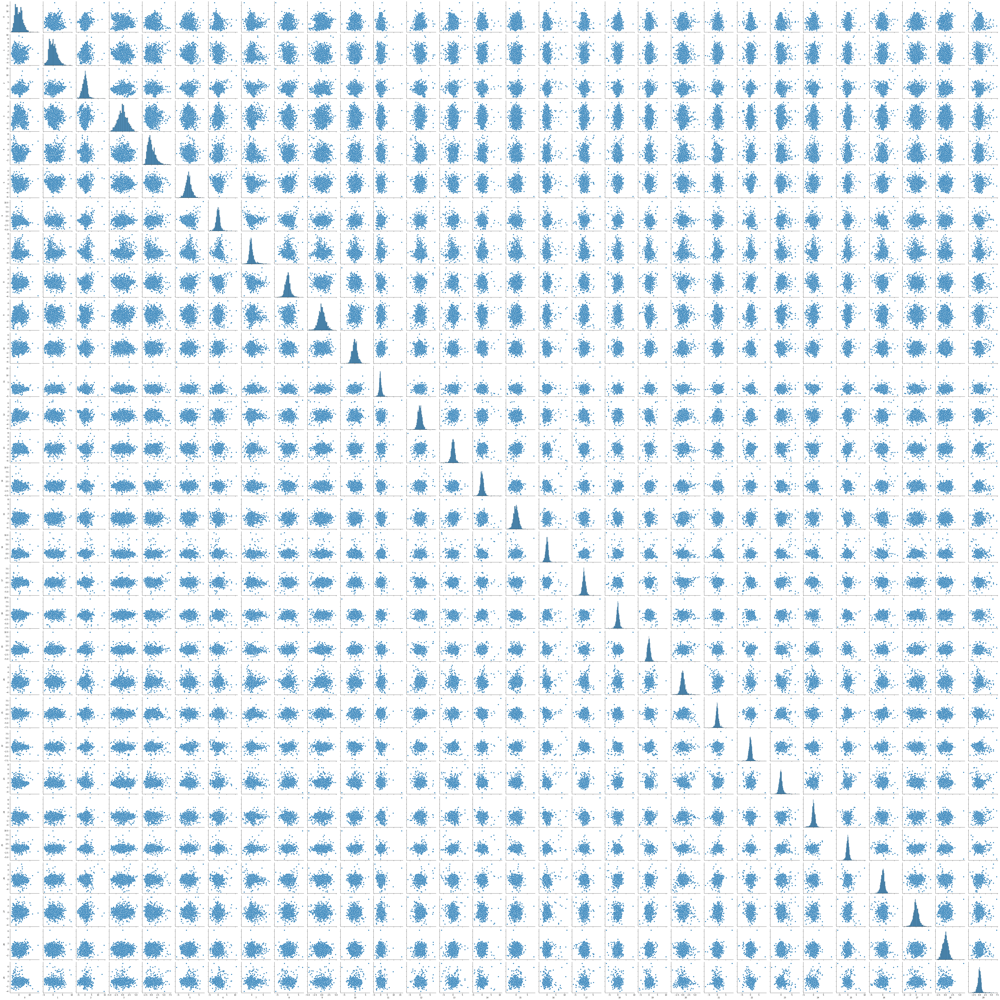

In [105]:
sns.pairplot(pd.DataFrame(Xpca3))

In [106]:
regression_model = LinearRegression()
regression_model.fit(XScaled, y)
regression_model.score(XScaled, y)

0.8495090747079205

In [107]:
regression_model_pca = LinearRegression()
regression_model_pca.fit(Xpca3, y)
regression_model_pca.score(Xpca3, y)

0.8241373113015038